In [1]:
import os
import pandas as pd
import json
import io
from typing import Dict, Set, Tuple
import pandas as pd
import torchvision
import zipfile
from sklearn import metrics
import numpy as np
from transformers.utils.constants import OPENAI_CLIP_MEAN, OPENAI_CLIP_STD
from PIL import Image
import requests
import torch
from matplotlib import rcParams
import matplotlib.pyplot as plt
from transformers import Owlv2Processor, Owlv2ForObjectDetection
from scipy.special import expit as sigmoid
import matplotlib.pyplot as plt
from transformers.image_transforms import center_to_corners_format
from scipy import integrate
from sklearn.manifold import TSNE
from torchmetrics.detection.mean_ap import MeanAveragePrecision
import seaborn as sns
import matplotlib.patches as patches

/home/pelinsu/.local/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
processor = Owlv2Processor.from_pretrained("google/owlv2-base-patch16-ensemble")
model = Owlv2ForObjectDetection.from_pretrained("google/owlv2-base-patch16-ensemble")

device = torch.device("cuda:0")
model = model.to(device)

/home/pelinsu/.local/lib/python3.8/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [3]:
def plot_query_image(directory):
    # Set figure size
    %matplotlib inline
    # Source image
    source_image = Image.open(directory)

    # Display input image
    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    ax.imshow(source_image)
    return source_image

def get_preprocessed_image(pixel_values):
    pixel_values = pixel_values.squeeze().numpy()
    unnormalized_image = (pixel_values * np.array(OPENAI_CLIP_STD)[:, None, None]) + np.array(OPENAI_CLIP_MEAN)[:, None, None]
    unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
    unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
    unnormalized_image = Image.fromarray(unnormalized_image)
    return unnormalized_image

def get_objectness_boxes_embeddings(source_pixel_values):
    # Get image features
    with torch.no_grad():
        feature_map = model.image_embedder(source_pixel_values)[0]
    del source_pixel_values
    torch.cuda.empty_cache()
    
    # Rearrange feature map
    batch_size, height, width, hidden_size = feature_map.shape
    image_features = feature_map.reshape(batch_size, height * width, hidden_size)

    # Get objectness logits
    objectnesses = model.objectness_predictor(image_features)
    
    source_boxes = model.box_predictor(image_features, feature_map=feature_map)
    source_class_embeddings = model.class_predictor(image_features)[1]           
    
    return objectnesses, source_boxes, source_class_embeddings

def plot_top_objects(unnormalized_source_image, objectnesses, source_boxes, source_class_embeddings, top_k=5):
    index_list = []
    # Remove batch dimension
    objectnesses = np.array(objectnesses[0].detach())
    source_boxes = np.array(source_boxes[0].detach())
    source_class_embeddings = np.array(source_class_embeddings[0].detach())

    # Let's show the top k patches
#     min_score = np.min(objectnesses)
#     max_score = np.max(objectnesses)
#     objectnesses = (objectnesses - min_score) / (max_score - min_score)
    
    
    objectnesses = sigmoid(objectnesses)
    objectness_threshold = np.partition(objectnesses, -top_k)[-top_k]

    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    ax.imshow(unnormalized_source_image, extent=(0, 1, 1, 0))
    ax.set_axis_off()

    for i, (box, objectness) in enumerate(zip(source_boxes, objectnesses)):
        if objectness < objectness_threshold:
            continue

        cx, cy, w, h = box
        ax.plot(
          [cx - w / 2, cx + w / 2, cx + w / 2, cx - w / 2, cx - w / 2],
          [cy - h / 2, cy - h / 2, cy + h / 2, cy + h / 2, cy - h / 2],
          color='lime',)

        print("Index:", i)
        index_list.append(i)
        print("Objectness:", objectness)

        ax.text(
              cx - w / 2 + 0.015,
              cy + h / 2 - 0.015,
              f'Index {i}: {objectness:1.2f}',
              ha='left',
              va='bottom',
              color='black',
              bbox={
                  'facecolor': 'white',
                  'edgecolor': 'lime',
                  'boxstyle': 'square,pad=.3',
              },
          )

    ax.set_xlim(0, 1)
    ax.set_ylim(1, 0)
    ax.set_title(f'Top {top_k} objects by objectness')
    return index_list

def process_target_images(file_list, zip_ref):
    
    images = []

    for filename in file_list:
        if filename.endswith('.jpg') or filename.endswith('.JPG'):
            image_data = zip_ref.read(filename)
            image = Image.open(io.BytesIO(image_data))
            images.append(image)

    target_pixel_values = processor(images=images, return_tensors="pt").pixel_values
    return target_pixel_values

def return_objectness_boxes_embeddings(target_directory, num_target_images):
    batch_size = 1

    target_boxes_list = []   
    target_objectness_list = []
    target_embeddings_list = []

    with zipfile.ZipFile(target_directory, 'r') as zip_ref:
        file_list = zip_ref.namelist()[:num_target_images]
        
        for i in range(num_target_images // batch_size):
            
            start_idx = i * batch_size
            end_idx = min((i + 1) * batch_size, len(file_list))
            target_pixel_values = process_target_images(file_list[start_idx:end_idx], zip_ref).to(device)

            objectnesses, source_boxes, source_class_embeddings = get_objectness_boxes_embeddings(target_pixel_values)

            objectnesses = objectnesses.cpu().detach().numpy().reshape(batch_size,3600,1)
            source_boxes = source_boxes.cpu().detach().numpy().reshape(batch_size,3600,4)
            source_class_embeddings = source_class_embeddings.cpu().detach().numpy().reshape(batch_size,3600,512)
                
            target_boxes_list.append(source_boxes)
            target_embeddings_list.append(source_class_embeddings)
            target_objectness_list.append(objectnesses)


        target_boxes = np.concatenate(target_boxes_list, axis=0)
        target_objectness = np.concatenate(target_objectness_list, axis=0)
        target_embeddings = np.concatenate(target_embeddings_list, axis=0)

    return target_objectness, target_boxes, target_embeddings

# PREPARE TARGET IMAGES AND ANNOTATIONS

In [4]:
def process_single_image(image_path):
    with Image.open(image_path) as image:
        return image.copy()

def get_image_id(file_name):
    return file_name_to_id.get(file_name, None)

def get_annotations_by_image_id(image_id, ann):
    return [entry for entry in ann if entry['image_id'] == image_id]

def process_target_images(img_folder):
    images = []
    image_names = []

    for filename in os.listdir(img_folder):
        if filename.endswith('.jpg') or filename.endswith('.JPG'):
            image_names.append(filename)
            img_path = os.path.join(img_folder, filename)
            
            # Open the image with 'with' to ensure it closes automatically
            with Image.open(img_path) as image:
                images.append(image.copy())  # Copy to store the image in memory

    return images, image_names

def process_correct_boxes(annotations, img_id):
    
    data = []

    for ann in annotations:
        category_id = ann['category_id']
        bbox = ann['bbox']  # COCO format bbox: [xmin, ymin, width, height]
        xmin, ymin, width, height = bbox
        xmax = xmin + width
        ymax = ymin + height

        data.append({
            'image_id': img_id,
            'label_id': category_id,
            'xmin': xmin,
            'ymin': ymin,
            'xmax': xmax,
            'ymax': ymax
        })

    # Convert the list of dictionaries to a dataframe
    target_df = pd.DataFrame(data)
    return target_df

# ERROR ANALYSIS

In [5]:
category_map = {0: 'camping car', 1: 'car', 2: 'pickup', 3: 'truck', 4: 'van'}

TARGETS_DF_COLUMNS = [
    "image_id",
    "label_id",
    "target_id",
    "xmin",
    "ymin",
    "xmax",
    "ymax",
]


PREDS_DF_COLUMNS = [
    "pred_id",
    "label_id",
    "image_id",
    "xmin",
    "ymin",
    "xmax",
    "ymax",
    "score",
]

ERROR_COUNTS_DF_COLUMNS = [
    "IoU thresholds",
    "background",
    "localization",
    "duplicate",
    "correct",
    "missed"
]

ERROR_COUNTS_DF_COLUMNS2 = [
    "score threshold",
    "background",
    "localization",
    "classification",
    "cls & loc",
    "duplicate",
    "correct",
    "missed",
    "precision",
    "recall",
    "f1 score"
]

ERRORS_DF_COLUMNS = ["pred_id", "target_id", "error_type"]

class ErrorType:
    OK = "correct"  # pred -> IoU > foreground; target_label == pred_label; highest score
    CLS = "classification"  # pred -> IoU > foreground; target_label != pred_label
    LOC = "localization"  # pred -> background < IoU < foreground; target_label == pred_label
    CLS_LOC = "cls & loc"  # pred -> background < IoU < foreground; target_label != pred_label
    DUP = "duplicate"  # pred -> background < IoU < foreground; target_label != pred_label
    BKG = "background"  # pred -> IoU > foreground; target_label == pred_label; no highest score
    MISS = "missed"  # target -> No pred with Iou > background


def classify_predictions_errors(
    targets_df: pd.DataFrame,
    preds_df: pd.DataFrame,
    iou_background,
    iou_foreground,
) -> pd.DataFrame:
    """Classify predictions
    We assume model is right as much as possible. Thus, in case of doubt
    (i.e matching two targets), a prediction will be first considered
    ErrorType.LOC before ErrorType.CLS.
    The error definition credit belongs to the following paper (refer to it for
    conceptual details):
        TIDE: A General Toolbox for Identifying Object Detection Errors
        https://arxiv.org/abs/2008.08115
    :param targets_df: DataFrame with all targets for all images with TARGETS_DF_COLUMNS.
    :param preds_df: DataFrame with all predictions for all images with PREDS_DF_COLUMNS.
    :param iou_background: Minimum IoU for a prediction not to be considered background.
    :param iou_foreground: Minimum IoU for a prediction to be considered foreground.
    :return errors_df: DataFrame with all error information with ERRORS_DF_COLUMNS
    """

    # Provide clarity on expectations and avoid confusing errors down the line
    assert (set(TARGETS_DF_COLUMNS) - set(targets_df.columns)) == set()
    assert (set(PREDS_DF_COLUMNS) - set(preds_df.columns)) == set()

    pred2error = dict()  # {pred_id: ErrorType}
    target2pred = (
        dict()
    )  # {target_id: pred_id}, require iou > iou_foreground & max score
    pred2target = dict()  # {pred_id: target_id}, require iou >= iou_background
    missed_targets = set()  # {target_id}
    
    correct_scores = []

    # Higher scoring preds take precedence when multiple fulfill criteria
    preds_df = preds_df.sort_values(by="score", ascending=False)
    errors_df = pd.DataFrame(columns=ERRORS_DF_COLUMNS)
    if preds_df.empty:

        missed_targets = _find_missed_targets(targets_df, pred2target)
        errors_df = _format_errors_as_dataframe(
                pred2error, pred2target, missed_targets
            )
    for image_id, im_preds_df in preds_df.groupby("image_id"):
        # Need to reset index to access dfs with same idx we access
        #   IoU matrix down the line
        im_targets_df = targets_df.query("image_id == @image_id").reset_index(
            drop=True
        )
        im_preds_df = im_preds_df.reset_index(drop=True)
        im_preds_df = im_preds_df.sort_values(by="score", ascending=False)

        if im_targets_df.empty:
            pred2error = {**pred2error, **_process_empty_image(im_preds_df)}
        else:
            iou_matrix, iou_label_match_matrix = _compute_iou_matrices(
                im_targets_df, im_preds_df
            )
            # Iterate over all predictions. Higher scores first
            for pred_idx in range(len(im_preds_df)):
                match_found = _match_pred_to_target_with_same_label(
                    pred_idx,
                    pred2error,
                    pred2target,
                    target2pred,
                    iou_label_match_matrix,
                    im_targets_df,
                    im_preds_df,
                    iou_background,
                    iou_foreground,
                )
                if match_found:
                    if pred2error[im_preds_df.at[pred_idx, "pred_id"]]==ErrorType.OK:
                        correct_scores.append(im_preds_df.at[pred_idx, "score"])
                    continue

                _match_pred_wrong_label_or_background(
                    pred_idx,
                    pred2error,
                    pred2target,
                    iou_matrix,
                    im_targets_df,
                    im_preds_df,
                    iou_background,
                    iou_foreground,
                )

        missed_targets = _find_missed_targets(targets_df, pred2target)
        #print(pred2error)
        errors_df = _format_errors_as_dataframe(
            pred2error, pred2target, missed_targets
        )
    return errors_df[list(ERRORS_DF_COLUMNS)], correct_scores


def _process_empty_image(im_preds_df: pd.DataFrame) -> Dict[int, str]:
    """In an image without targets, all predictions represent a background error"""
    return {
        pred_id: ErrorType.BKG for pred_id in im_preds_df["pred_id"].unique()
    }


def _compute_iou_matrices(
    im_targets_df: pd.DataFrame, im_preds_df: pd.DataFrame
) -> Tuple[np.array, np.array]:
    """Compute IoU matrix between all targets and preds in the image
    :param im_targets_df: DataFrame with targets for the image being processed.
    :param im_preds_df: DataFrame with preds for the image being processed.
    :return:
        iou_matrix: Matrix of size (n_targets, n_preds) with IoU between all
            targets & preds
        iou_label_match_matrix: Same as `iou_matrix` but 0 for all target-pred
            pair with different labels (i.e. IoU kept only if labels match).
    """
    # row indexes point to targets, column indexes to predictions
    iou_matrix = iou_matrix = torchvision.ops.box_iou(
        torch.from_numpy(
            im_targets_df[["xmin", "ymin", "xmax", "ymax"]].values
        ),
        torch.from_numpy(im_preds_df[["xmin", "ymin", "xmax", "ymax"]].values),
    ).numpy()

    # boolean matrix with True iff target and pred have the same label
    label_match_matrix = (
        im_targets_df["label_id"].values[:, None]
        == im_preds_df["label_id"].values[None, :]
    )
    # IoU matrix with 0 in all target-pred pairs that have different label
    iou_label_match_matrix = iou_matrix * label_match_matrix
    return iou_matrix, iou_label_match_matrix


def _match_pred_to_target_with_same_label(
    pred_idx: int,
    pred2error: Dict[int, str],
    pred2target: Dict[int, int],
    target2pred: Dict[int, int],
    iou_label_match_matrix: np.array,
    im_targets_df: pd.DataFrame,
    im_preds_df: pd.DataFrame,
    iou_background: float,
    iou_foreground: float,
) -> bool:
    """Try to match `pred_idx` to a target with the same label and identify error (if any)
    If there is a match `pred2error`, `pred2target` and (maybe) `target2pred`
    are modified in place.
    Possible error types found in this function:
        ErrorType.OK, ErrorType.DUP, ErrorType.LOC
    :param pred_idx: Index of prediction based on score (index 0 is maximum score for image).
    :param pred2error: Dict mapping pred_id to error type.
    :param pred2target: Dict mapping pred_id to target_id (if match found with iou above background)
    :param target2pred: Dict mapping target_id to pred_id to pred considered correct (if any).
    :param iou_label_match_matrix: Matrix with size [n_targets, n_preds] with IoU between all preds
        and targets that share label (i.e. IoU = 0 if there is a label missmatch).
    :param im_targets_df: DataFrame with targets for the image being processed.
    :param im_preds_df: DataFrame with preds for the image being processed.
    :param iou_background: Minimum IoU to consider a pred not background for target.
    :param iou_foreground: Minimum IoU to consider a pred foreground for a target.
    :return matched: Whether or not there was a match and we could identify the pred error.
    """
    # Find highest overlapping target for pred processed
    target_idx = np.argmax(iou_label_match_matrix[:, pred_idx])
    iou = np.max(iou_label_match_matrix[:, pred_idx])
    target_id = im_targets_df.at[target_idx, "target_id"]
    pred_id = im_preds_df.at[pred_idx, "pred_id"]

    matched = False
    if iou >= iou_foreground:
        pred2target[pred_id] = target_id
        # Check if another prediction is already the match for target to
        #   identify duplicates
        if target2pred.get(target_id) is None:
            target2pred[target_id] = pred_id
            pred2error[pred_id] = ErrorType.OK
        else:
            pred2error[pred_id] = ErrorType.DUP
        matched = True

    elif iou_background <= iou < iou_foreground:
        pred2target[pred_id] = target_id
        pred2error[pred_id] = ErrorType.LOC
        matched = True
    return matched


def _match_pred_wrong_label_or_background(
    pred_idx: int,
    pred2error: Dict[int, str],
    pred2target: Dict[int, int],
    iou_matrix: np.array,
    im_targets_df: pd.DataFrame,
    im_preds_df: pd.DataFrame,
    iou_background: float,
    iou_foreground: float,
) -> None:
    """Try to match `pred_idx` to a target (with different label) and identify error
    If there is a match `pred2error` and  (maybe) `pred2target` are modified in place.
    Possible error types found in this function:
        ErrorType.BKG, ErrorType.CLS, ErrorType.CLS_LOC
    :param pred_idx: Index of prediction based on score (index 0 is maximum score for image).
    :param pred2error: Dict mapping pred_id to error type.
    :param pred2target: Dict mapping pred_id to target_id (if match found with iou above background)
    :param target2pred: Dict mapping target_id to pred_id to pred considered correct (if any).
    :param iou: Matrix with size [n_targets, n_preds] with IoU between all preds and targets.
    :param im_targets_df: DataFrame with targets for the image being processed.
    :param im_preds_df: DataFrame with preds for the image being processed.
    :param iou_background: Minimum IoU to consider a pred not background for target.
    :param iou_foreground: Minimum IoU to consider a pred foreground for a target.
    """
    # Find highest overlapping target for pred processed
    target_idx = np.argmax(iou_matrix[:, pred_idx])
    iou = np.max(iou_matrix[:, pred_idx])
    target_id = im_targets_df.at[target_idx, "target_id"]
    pred_id = im_preds_df.at[pred_idx, "pred_id"]

    if iou < iou_background:
        pred2error[pred_id] = ErrorType.BKG

    # preds with correct label do not get here. Thus, no need to check if label
    #   is wrong
    elif iou >= iou_foreground:
        pred2target[pred_id] = target_id
        pred2error[pred_id] = ErrorType.CLS
    else:
        # No match to target, as we cannot be sure model was remotely close to
        #   getting it right
        pred2error[pred_id] = ErrorType.CLS_LOC


def _find_missed_targets(
    im_targets_df: pd.DataFrame, pred2target: Dict[int, int]
) -> Set[int]:
    """Find targets in the processed image that were not matched by any prediction
    :param im_targets_df: DataFrame with targets for the image being processed.
    :param pred2target: Dict mapping pred_id to target_id (if match found with
        iou above background)
    :return missed_targets: Set of all the target ids that were missed
    """
    matched_targets = [t for t in pred2target.values() if t is not None]
    missed_targets = set(im_targets_df["target_id"]) - set(matched_targets)
    return missed_targets


def _format_errors_as_dataframe(
    pred2error: Dict[int, str],
    pred2target: Dict[int, int],
    missed_targets: Set[int],
) -> pd.DataFrame:
    """Use the variables used to classify errors to format them in a ready to use DataFrame
    :param pred2error: Dict mapping pred_id to error type.
    :param pred2target: Dict mapping pred_id to target_id (if match found with
        iou above background)
    :param missed_targets: Set of all the target ids that were missed
    :return: DataFrame with columns ERRORS_DF_COLUMNS
    """
    
    # Handle missed targets
    missed_df = pd.DataFrame(
        {
            "pred_id": None,
            "error_type": ErrorType.MISS,
            "target_id": list(missed_targets),
        }
    ).astype({"pred_id": float, "target_id": float, "error_type": pd.StringDtype()})

    # Check if pred2error is empty
    if len(pred2error) > 0:
        # Create an error DataFrame from pred2error
        errors_df = pd.DataFrame.from_records(
            [{"pred_id": pred_id, "error_type": error} for pred_id, error in pred2error.items()]
        ).astype({"pred_id": float, "error_type": pd.StringDtype()})

        # Initialize the target_id column to None, then set the target_id for matched predictions
        errors_df["target_id"] = None
        if len(pred2target) > 0:
            for pred_id, target_id in pred2target.items():
                if pred_id in errors_df.index:
                    errors_df.at[pred_id, "target_id"] = target_id
    else:
        # If pred2error is empty, initialize an empty DataFrame with the correct columns
        errors_df = pd.DataFrame(columns=["pred_id", "error_type", "target_id"]).astype(
            {"pred_id": float, "error_type": pd.StringDtype(), "target_id": float}
        )

    # Concatenate with missed targets DataFrame
    errors_df = pd.concat(
        [errors_df, missed_df], ignore_index=True
    ).astype(
        {"pred_id": float, "target_id": float, "error_type": pd.StringDtype()}
    )

    return errors_df


def sum_all_errors(target_df, pred_df, background_IoU, foreground_IoU, num_image):
    summed_errors_df = pd.DataFrame()
    summed_errors = {}
    all_correct_scores = []
    # Iterate over each image
    for i in range(num_image):
        # Call the classification function for the current image
        errors_df, correct_scores = classify_predictions_errors(target_df[target_df["image_id"]==i], pred_df[pred_df["image_id"]==i], background_IoU, foreground_IoU)
        all_correct_scores.append(correct_scores)
        # Aggregate the error counts for the current image
        image_error_counts = errors_df['error_type'].value_counts()
        # If summed_errors_df is empty, assign the current error counts directly
        for error_type, count in image_error_counts.items():
            summed_errors[error_type] = summed_errors.get(error_type, 0) + count
    return summed_errors, all_correct_scores

def conf_thresh_errors(target_df, pred_df, score_thresholds, background_IoU, foreground_IoU, num_image):
    
    error_counts_df = pd.DataFrame(columns=ERROR_COUNTS_DF_COLUMNS2)
    
    for idx, i in enumerate(score_thresholds):

        counts, correct_scores = sum_all_errors(target_df, pred_df[pred_df['score']> i], background_IoU, foreground_IoU, num_image)
        
        counts['score threshold']=i
        
        if i == 0:
            correct_scores_zero_th = correct_scores    

        TP = counts.get('correct',0)
        FP = len(pred_df[pred_df['score']> i]) - TP
        FN = len(target_df) - counts.get('correct',0)
       
        if FP == 0:
            counts['precision'] = 1
        else:
        
            try:
                counts['precision'] = TP / (TP + FP)
            except ZeroDivisionError:
                counts['precision'] = 0
                
        if FN == 0:
            counts['recall'] = 1
        else:
        
            try:
                counts['recall'] = TP / (TP + FN)
            except ZeroDivisionError:
                counts['recall'] = 0    
        try:
            counts['f1 score'] = (2*counts['precision']*counts['recall']) / (counts['precision'] + counts['recall'])
        except ZeroDivisionError:
            counts['f1 score'] = 0


        for error_type in ERROR_COUNTS_DF_COLUMNS2:
            if error_type not in counts.keys():
                counts[error_type] = 0

        error_counts_df.loc[idx] = counts
            
    return error_counts_df, correct_scores_zero_th


def compute_ap(precision, recall):
    """
    Compute the Average Precision (AP) for a single precision-recall curve.
    Interpolated AP is used as defined in the PASCAL VOC challenge.
    """
    # Append sentinel values at the end
    mrec = np.concatenate(([0.0], recall, [1.0]))  # mrec is the modified recall list
    mpre = np.concatenate(([0.0], precision, [0.0]))  # mpre is the modified precision list

    # Compute the precision envelope
    for i in range(mpre.size - 1, 0, -1):
        mpre[i - 1] = np.maximum(mpre[i - 1], mpre[i])

    # Look for points where recall changes
    i = np.where(mrec[1:] != mrec[:-1])[0]

    # Compute AP
    ap = np.sum((mrec[i + 1] - mrec[i]) * mpre[i + 1])
    return ap


def AP_score(target_df, pred_df, num_image):
    auc_dict = {"IoU": [], "mAP": []}
    for i in BACKGROUND_IOU_THRESHOLD:
        for j in FOREGROUND_IOU_THRESHOLDS:
            error_counts_df, correct_scores_zero_th = conf_thresh_errors(target_df, pred_df, SCORE_THRESHOLDS, i, j, num_image)
            
            
            r = list(error_counts_df["recall"])
            r.sort(reverse = False)

            p = list(error_counts_df["precision"])
            p.sort(reverse = True)

            ap = compute_ap(p, r)
            
            auc_dict["IoU"].append((j))
            auc_dict["mAP"].append(ap)
    return pd.DataFrame(auc_dict)

def AP_score_per_category(target_df, pred_df, num_image, best_iou):
    categories = np.unique(target_df['label_id'])
    auc_dict = {"category": [], "AP": []}
    for i in categories:
        error_counts_df, correct_scores_zero_th = conf_thresh_errors(target_df[target_df["label_id"]==i], pred_df[pred_df["label_id"]==i], SCORE_THRESHOLDS, 0.1, best_iou, num_image)
        r = list(error_counts_df["recall"])
        r.sort(reverse = False)

        p = list(error_counts_df["precision"])
        p.sort(reverse = True)

        ap = compute_ap(p, r)
            
        auc_dict["category"].append((i))
        auc_dict["AP"].append(ap)
    return pd.DataFrame(auc_dict)

def precision_recall_curve(filtered_df, error_counts_df, ap):
    # Plot precision-recall curve
    plt.plot(error_counts_df["recall"], error_counts_df["precision"], marker='o', linestyle='-')
    for i in range(len(filtered_df)):
        plt.annotate(str(round(filtered_df["score threshold"].iloc[i],3)), xy = (filtered_df["recall"].iloc[i], filtered_df["precision"].iloc[i] + 0.01), ha='center')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.title(f'Precision-Recall Curve (AP@{ap})')
    plt.grid(True)
    plt.show()

def show_all_analysis(target_df, pred_df, num_image, category_map):  
    
    AP_df = AP_score(target_df, pred_df, num_image)
    plt.figure(figsize=(6, 6))
    ax = AP_df.plot(x="IoU",y="mAP", xlabel="IoU Threshold", ylabel="Mean Average Precision at IoU")
    
    for i in range(len(AP_df)):
        iou_value = AP_df['IoU'][i]
        ap_value = AP_df['mAP'][i]
        ax.annotate(f'{ap_value:.2f}', (iou_value, ap_value), textcoords="offset points", xytext=(0,10), ha='center')

    plt.title(f'Average Precision vs IoU Threshold')
    plt.grid(True)
    plt.show()
    
    best_iou_threshold = AP_df.iloc[AP_df[["mAP"]].idxmax()]["IoU"].iloc[0]
    
       
    AP_df_per_category = AP_score_per_category(target_df, pred_df, num_image, best_iou_threshold)


    categories = [category_map.get(i) for i in AP_df_per_category["category"]]
    ap_values = AP_df_per_category["AP"]
    print(categories)
    print(ap_values)

    # Create a bar plot
    plt.figure(figsize=(10, 6))
    plt.bar(categories, ap_values, color='skyblue')

    # Add labels and title
    plt.xlabel('Category')
    plt.ylabel('Average Precision (AP)')
    plt.title('AP Score per Category')
    
    # Rotate category labels for better readability if needed
    plt.xticks(rotation=45, ha="right")
    
    # Display the plot
    plt.tight_layout()
    plt.show()
        
    error_counts_df, correct_scores_zero_th = conf_thresh_errors(target_df, pred_df, SCORE_THRESHOLDS, BACKGROUND_IOU_THRESHOLD, best_iou_threshold, num_image)
    filtered_df = error_counts_df.iloc[::2].reset_index(drop=True)
    display(filtered_df)

    query_F1 = filtered_df.iloc[filtered_df['f1 score'].idxmax()]
    best_confidence_threshold = query_F1["score threshold"]

    precision_recall_curve(filtered_df, error_counts_df, best_iou_threshold)
    print("BEST CONFIDENCE THRESHOLD: ", round(best_confidence_threshold, 2))
    
    return query_F1, correct_scores_zero_th

def box_iou_calc(boxes1, boxes2):
    # https://github.com/pytorch/vision/blob/master/torchvision/ops/boxes.py
    """
    Return intersection-over-union (Jaccard index) of boxes.
    Both sets of boxes are expected to be in (x1, y1, x2, y2) format.
    Arguments:
        boxes1 (Array[N, 4])
        boxes2 (Array[M, 4])
    Returns:
        iou (Array[N, M]): the NxM matrix containing the pairwise
            IoU values for every element in boxes1 and boxes2

    This implementation is taken from the above link and changed so that it only uses numpy..
    """

    def box_area(box):
        # box = 4xn
        return (box[2] - box[0]) * (box[3] - box[1])

    area1 = box_area(boxes1.T)
    area2 = box_area(boxes2.T)

    lt = np.maximum(boxes1[:, None, :2], boxes2[:, :2])  # [N,M,2]
    rb = np.minimum(boxes1[:, None, 2:], boxes2[:, 2:])  # [N,M,2]

    inter = np.prod(np.clip(rb - lt, a_min=0, a_max=None), 2)
    return inter / (area1[:, None] + area2 - inter)  # iou = inter / (area1 + area2 - inter)


class ConfusionMatrix:
    def __init__(self, num_classes: int, CONF_THRESHOLD=0.3, IOU_THRESHOLD=0.5):
        self.matrix = np.zeros((num_classes + 1, num_classes + 1))
        self.num_classes = num_classes
        self.CONF_THRESHOLD = CONF_THRESHOLD
        self.IOU_THRESHOLD = IOU_THRESHOLD

    def process_batch(self, detections, labels: np.ndarray):
        """
        Return intersection-over-union (Jaccard index) of boxes.
        Both sets of boxes are expected to be in (x1, y1, x2, y2) format.
        Arguments:
            detections (Array[N, 6]), x1, y1, x2, y2, conf, class
            labels (Array[M, 5]), class, x1, y1, x2, y2
        Returns:
            None, updates confusion matrix accordingly
        """
        gt_classes = labels[:, 0].astype(np.int16)

        try:
            detections = detections[detections[:, 4] > self.CONF_THRESHOLD]
        except IndexError or TypeError:
            # detections are empty, end of process
            for i, label in enumerate(labels):
                gt_class = gt_classes[i]
                self.matrix[self.num_classes, gt_class] += 1
            return

        detection_classes = detections[:, 5].astype(np.int16)

        all_ious = box_iou_calc(labels[:, 1:], detections[:, :4])
        want_idx = np.where(all_ious > self.IOU_THRESHOLD)

        all_matches = [[want_idx[0][i], want_idx[1][i], all_ious[want_idx[0][i], want_idx[1][i]]]
                       for i in range(want_idx[0].shape[0])]

        all_matches = np.array(all_matches)
        if all_matches.shape[0] > 0:  # if there is match
            all_matches = all_matches[all_matches[:, 2].argsort()[::-1]]

            all_matches = all_matches[np.unique(all_matches[:, 1], return_index=True)[1]]

            all_matches = all_matches[all_matches[:, 2].argsort()[::-1]]

            all_matches = all_matches[np.unique(all_matches[:, 0], return_index=True)[1]]

        for i, label in enumerate(labels):
            gt_class = gt_classes[i]
            if all_matches.shape[0] > 0 and all_matches[all_matches[:, 0] == i].shape[0] == 1:
                detection_class = detection_classes[int(all_matches[all_matches[:, 0] == i, 1][0])]
                self.matrix[detection_class, gt_class] += 1
            else:
                self.matrix[self.num_classes, gt_class] += 1

        for i, detection in enumerate(detections):
            if not all_matches.shape[0] or ( all_matches.shape[0] and all_matches[all_matches[:, 1] == i].shape[0] == 0 ):
                detection_class = detection_classes[i]
                self.matrix[detection_class, self.num_classes] += 1

    def return_matrix(self):
        return self.matrix

    def print_matrix(self):
        for i in range(self.num_classes + 1):
            print(' '.join(map(str, self.matrix[i])))   
            
def plot_conf_matrix(preds_df, targets_df, score_threshold, iou_threshold):
    # Prepare predictions
    preds = preds_df[["xmin", "ymin", "xmax", "ymax", "score", "label_id"]].to_numpy()

    # Prepare ground truths
    gt_boxes = targets_df[["label_id", "xmin", "ymin", "xmax", "ymax"]].to_numpy()

    # Initialize confusion matrix for 2 classes
    conf_mat = ConfusionMatrix(num_classes=5, CONF_THRESHOLD=score_threshold, IOU_THRESHOLD=iou_threshold)

    # Process the batch (predictions and ground truths)
    conf_mat.process_batch(preds, gt_boxes)

    # Assuming `conf_mat.matrix` contains the confusion matrix
    conf_matrix = conf_mat.return_matrix()
    class_names = ['camping car', 'car', 'pickup', 'truck', 'van','Background']

    # Create a heatmap
    plt.figure(figsize=(10, 7))
    sns.heatmap(conf_matrix, annot=True, fmt=".1f", cmap='Blues', 
                xticklabels=class_names, yticklabels=class_names)

    plt.xlabel('Predicted Classes')
    plt.ylabel('True Classes')
    plt.title('Confusion Matrix')
    plt.show()

def plot_bounding_boxes(image, preds, targets, label_mapping):
    """
    Plots predicted and target bounding boxes on the image with a legend
    and label mapping.
    """
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(image)

    # Plot predicted boxes (in red) with the label above the box
    for _, pred in preds.iterrows():
        rect = patches.Rectangle(
            (pred['xmin'], pred['ymin']),
            pred['xmax'] - pred['xmin'],
            pred['ymax'] - pred['ymin'],
            linewidth=2,
            edgecolor='r',
            facecolor='none'
        )
        ax.add_patch(rect)
        label_name = label_mapping[pred['label_id']]  # Convert label ID to string label
        ax.text(pred['xmin'], pred['ymin'] - 20, f"{label_name}", 
                color='r', fontsize=12, verticalalignment='top')

    # Plot target boxes (in green) with the label below the box
    for _, target in targets.iterrows():
        rect = patches.Rectangle(
            (target['xmin'], target['ymin']),
            target['xmax'] - target['xmin'],
            target['ymax'] - target['ymin'],
            linewidth=2,
            edgecolor='g',
            facecolor='none'
        )
        ax.add_patch(rect)
        label_name = label_mapping[target['label_id']]  # Convert label ID to string label
        ax.text(target['xmin'], target['ymax'] + 20, f"{label_name}", 
                color='g', fontsize=12, verticalalignment='bottom')

    # Add a legend
    legend_handles = [
        patches.Patch(color='r', label='Prediction'),
        patches.Patch(color='g', label='Ground Truth')
    ]
    ax.legend(handles=legend_handles, loc='upper right')

    ax.axis('off')
    plt.show()


def plot_images_with_bboxes(final_preds_df, final_targets_df, image_folder, label_mapping, score_threshold=0.5, num_images=10):
    """
    Plots a specified number of images with predictions and ground truth bounding boxes.
    
    :param final_preds_df: DataFrame containing predicted bounding boxes and scores.
    :param final_targets_df: DataFrame containing ground truth bounding boxes.
    :param image_folder: Path to the folder where the images are stored.
    :param score_threshold: Threshold for filtering predictions based on score.
    :param num_images: Number of images to plot.
    """
    # Filter predictions by score threshold
    filtered_preds_df = final_preds_df[final_preds_df['score'] >= score_threshold]

    # Get the unique image files from the filtered predictions
    image_files = filtered_preds_df['image_file'].unique()[:num_images]

    # Plot each image separately
    for image_file in image_files:
        image_path = os.path.join(image_folder, image_file)

        # Load image
        image = Image.open(image_path)

        # Get predictions and targets for the current image
        preds = filtered_preds_df[filtered_preds_df['image_file'] == image_file]
        targets = final_targets_df[final_targets_df['image_file'] == image_file]

        # Plot the image with bounding boxes
        plot_bounding_boxes(image, preds, targets, label_mapping)


# IMAGE QUERY

In [6]:
def get_target_box_scores_logits(target_pixel_values, query_embedding):
    with torch.no_grad():
        feature_map = model.image_embedder(target_pixel_values)[0]
        del target_pixel_values
        torch.cuda.empty_cache()

        batch_size, height, width, hidden_size = feature_map.shape
        image_features = feature_map.reshape(batch_size, height * width, hidden_size)

        objectnesses = model.objectness_predictor(image_features)

        target_boxes = model.box_predictor(
            image_features, feature_map=feature_map
        )

        target_class_predictions = model.class_predictor(
        feature_map.reshape(batch_size, height * width, hidden_size), query_embeddings,  # [batch, queries, d]
        )[0]
    
    return objectnesses, target_boxes, target_class_predictions

def post_process_object_detection_image_query(outputs_objectness, output_boxes, output_scores, objectness_threshold, img_id):

    preds_df = []
    #for i in range(len(outputs_objectness[0])):
        # Apply sigmoid to the objectness logits and filter based on the threshold
    objectness_scores = torch.sigmoid(outputs_objectness[0].cpu())
    object_indices = torch.nonzero(objectness_scores > objectness_threshold).squeeze()
    output_scores = output_scores.cpu().squeeze(-1).transpose(0, 1)


    #Get the best scores and corresponding labels
    #logits = torch.sigmoid(output_scores)
    logits = output_scores
    best_scores, best_query_indices = logits.max(dim=1)

    # Filter scores and labels based on object indices
    best_scores = best_scores[object_indices]
    best_query_labels = best_query_indices[object_indices]

    # Handle case when there's only one bounding box (ensure correct dimensions)
    if object_indices.dim() == 0:
        object_indices = object_indices.unsqueeze(0)
        best_scores = best_scores.unsqueeze(0)
        best_query_labels = best_query_labels.unsqueeze(0)

    # Get bounding boxes and adjust them
    bounding_boxes = output_boxes[0][object_indices].cpu()
    if bounding_boxes.dim() == 1:  # Ensure it has the correct shape if only one bounding box
        bounding_boxes = bounding_boxes.unsqueeze(0)

    # Create DataFrame for this image's predictions
    preds_df.append(
        pd.DataFrame({
            "image_id": img_id,
            "score": best_scores,
            "label_id": best_query_labels,
            "xmin": (bounding_boxes[:, 0] - bounding_boxes[:, 2] / 2) * 640,
            "ymin": (bounding_boxes[:, 1] - bounding_boxes[:, 3] / 2) * 640,
            "xmax": (bounding_boxes[:, 0] + bounding_boxes[:, 2] / 2) * 640,
            "ymax": (bounding_boxes[:, 1] + bounding_boxes[:, 3] / 2) * 640
        })
    )

    final_preds_df = pd.concat(preds_df, ignore_index=True)

    return final_preds_df

# prepare query embeddings

In [7]:
def plot_query_image(img_path, num_objects):
    
    source_image = Image.open(img_path)
    source_pixel_values = processor(images=source_image, return_tensors="pt").pixel_values.to(device)

    objectnesses, source_boxes, source_class_embeddings = get_objectness_boxes_embeddings(source_pixel_values)

    # For visualization, we need the preprocessed source image (i.e. padded and resized, but not yet normalized)
    unnormalized_source_image = get_preprocessed_image(source_pixel_values.cpu())

    unnormalized_source_image

    plot_top_objects(unnormalized_source_image, objectnesses.cpu(), source_boxes.cpu(), source_class_embeddings.cpu(), top_k=num_objects)
    
    return source_class_embeddings


Index: 1424
Objectness: 0.24232452
Index: 2151
Objectness: 0.3015512


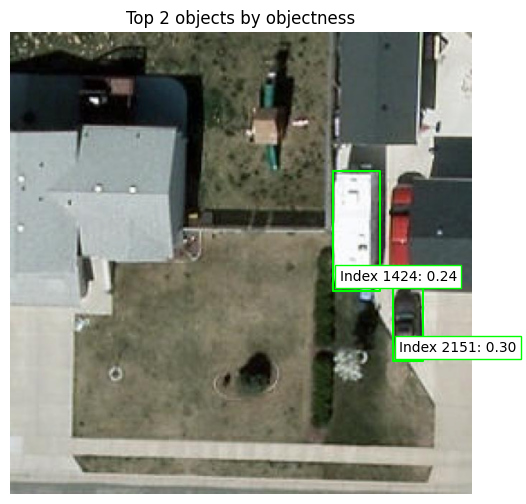

In [35]:
camping_car_emb = plot_query_image("vehicle_detection_satellite_coco/final_images/13699_jpg.rf.553848f9b0a3b9d1c8944fb363613758.jpg", 2)

Index: 861
Objectness: 0.28981113
Index: 971
Objectness: 0.23756197
Index: 1997
Objectness: 0.27671072


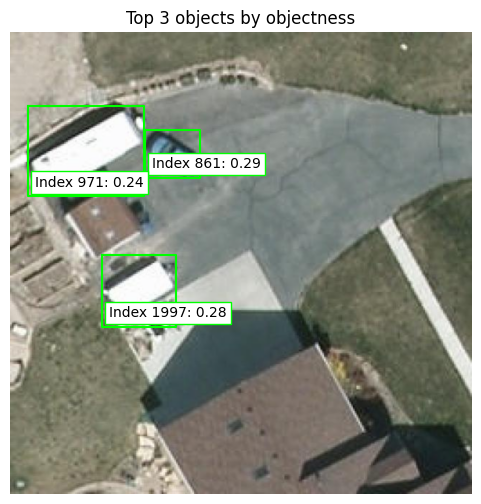

In [9]:
camping_car_emb2 = plot_query_image("vehicle_detection_satellite_coco/final_images/5306_jpg.rf.315ffa7e5e78ad12c4f92029a92200f1.jpg", 3)

Index: 1820
Objectness: 0.33435586
Index: 3072
Objectness: 0.32372746


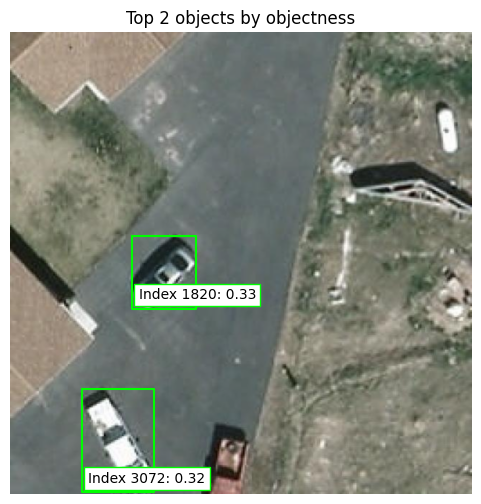

In [10]:
pickup_car_emb = plot_query_image("vehicle_detection_satellite_coco/final_images/2725_jpg.rf.52421a30faa69ade79dbf7a82a57682c.jpg", 2)

Index: 451
Objectness: 0.2850488
Index: 1885
Objectness: 0.30371615
Index: 2369
Objectness: 0.31790608
Index: 2952
Objectness: 0.32347924


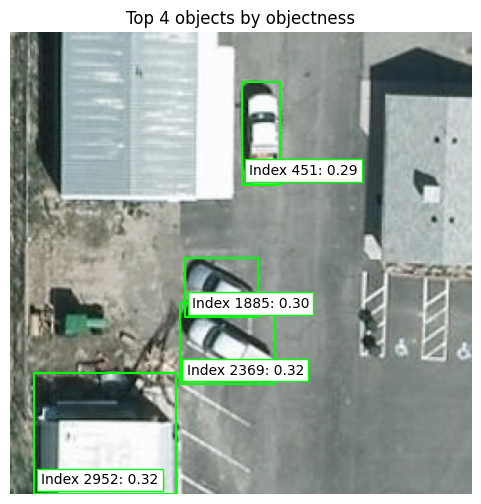

In [11]:
pickup_car_emb2 = plot_query_image("vehicle_detection_satellite_coco/final_images/19830_jpg.rf.fe9003e583caa2d1d5e2e6284c505dc1.jpg", 4)

Index: 506
Objectness: 0.35257825
Index: 1227
Objectness: 0.338674
Index: 2005
Objectness: 0.35699683
Index: 2410
Objectness: 0.34711874


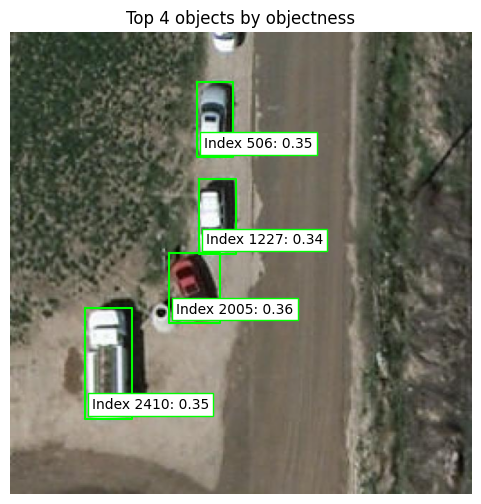

In [12]:
truck_emb = plot_query_image("vehicle_detection_satellite_coco/final_images/3370_jpg.rf.d82f68a32dd60fc65aa21cde9df259d3.jpg", 4)

Index: 1310
Objectness: 0.13939214
Index: 2079
Objectness: 0.36957523


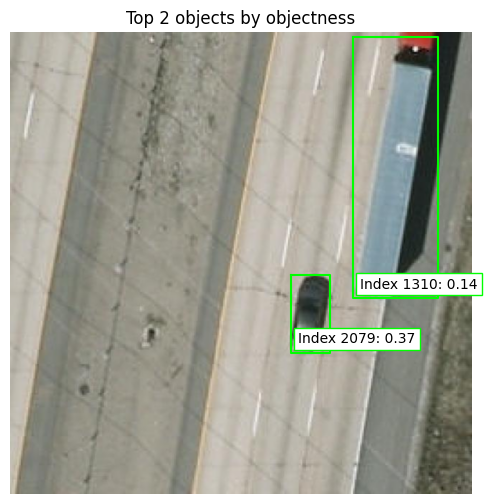

In [13]:
truck_emb2 = plot_query_image("vehicle_detection_satellite_coco/final_images/9301_jpg.rf.6a49874a1bcd66ed73c9b75e08c1ce83.jpg",2)

Index: 679
Objectness: 0.23787326
Index: 736
Objectness: 0.23971005
Index: 985
Objectness: 0.24393924


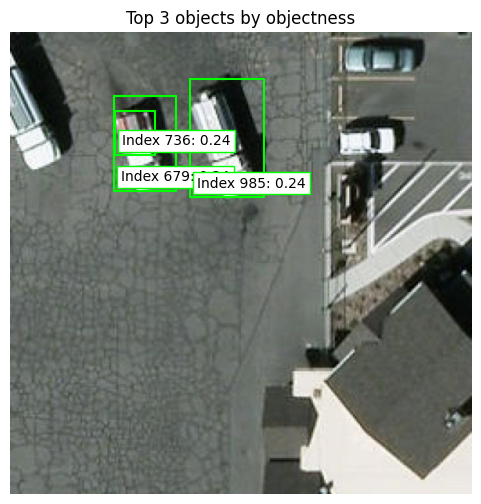

In [14]:
truck_emb3 = plot_query_image("vehicle_detection_satellite_coco/final_images/4902_jpg.rf.973498bc1554c641c30f2e970383a32f.jpg", 3)

Index: 1731
Objectness: 0.37730354
Index: 1963
Objectness: 0.3413928


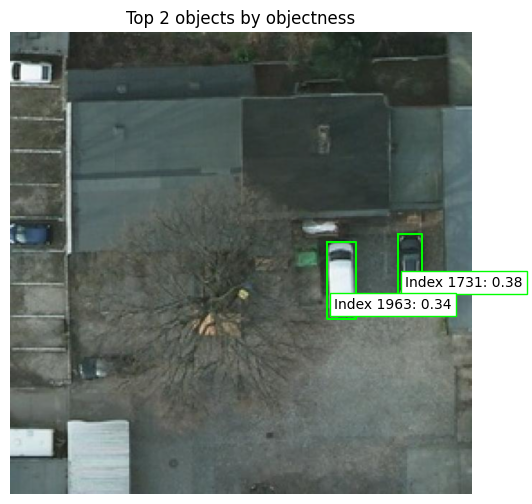

In [15]:
van_emb = plot_query_image("vehicle_detection_satellite_coco/final_images/1374_jpg.rf.6cc85dc5f6ab3094e9d352929a9138ce.jpg", 2)

Index: 870
Objectness: 0.37691006
Index: 3048
Objectness: 0.22783753
Index: 3280
Objectness: 0.38500255


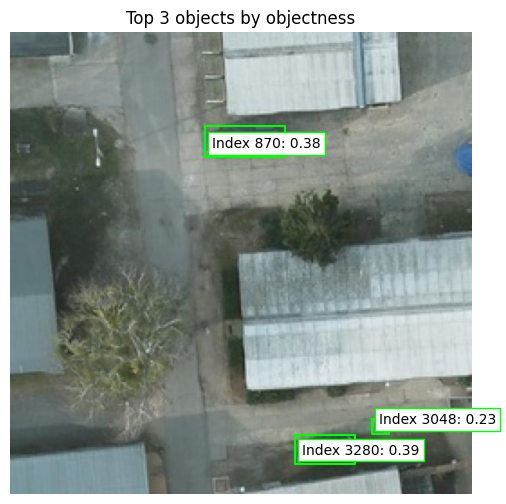

In [16]:
van_emb2 = plot_query_image("vehicle_detection_satellite_coco/final_images/224_jpg.rf.b969576e9d45f75a9430a9d11b3e1174.jpg", 3)

Index: 111
Objectness: 0.30587992
Index: 349
Objectness: 0.2510905
Index: 2930
Objectness: 0.2637398


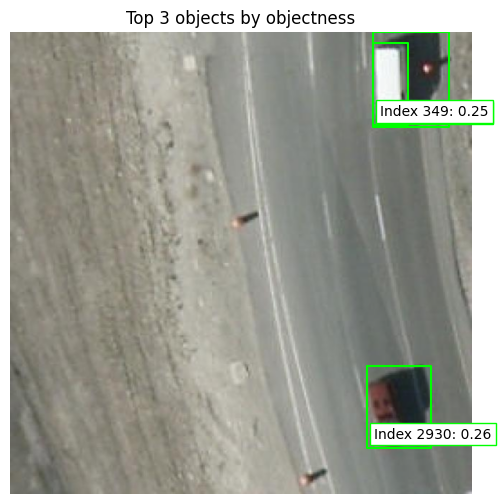

In [17]:
van_emb3 = plot_query_image("vehicle_detection_satellite_coco/final_images/8798_jpg.rf.bbda927246b868b43941948e2cfd96f3.jpg",3)

In [18]:
camping_car_query1 = camping_car_emb[0][1424].reshape(1,512)
camping_car_query2 = camping_car_emb2[0][971].reshape(1,512)
camping_car_query3 = camping_car_emb2[0][1997].reshape(1,512)

camping_car_query_arrays = torch.stack([camping_car_query1, camping_car_query2, camping_car_query3], axis=0)
camping_car_query = torch.mean(camping_car_query_arrays, axis=0)

car_query1 = pickup_car_emb[0][1820].reshape(1,512)
car_query2 = truck_emb[0][2005].reshape(1,512)
car_query3 = truck_emb[0][506].reshape(1,512)

car_query_arrays = torch.stack([car_query1, car_query2, car_query3], axis=0)
car_query = torch.mean(car_query_arrays, axis=0)

pickup_query1 = pickup_car_emb[0][3072].reshape(1,512)
pickup_query2 = pickup_car_emb2[0][451].reshape(1,512)
pickup_query3 = pickup_car_emb2[0][2369].reshape(1,512)

pickup_query_arrays = torch.stack([pickup_query1, pickup_query2, pickup_query3], axis=0)
pickup_query = torch.mean(pickup_query_arrays, axis=0)

truck_query1 = truck_emb[0][2410].reshape(1,512)
truck_query2 = truck_emb2[0][1310].reshape(1,512)
truck_query3 = truck_emb3[0][985].reshape(1,512)

truck_query_arrays = torch.stack([truck_query1, truck_query2, truck_query3], axis=0)
truck_query = torch.mean(truck_query_arrays, axis=0)

van_query1 = van_emb[0][1963].reshape(1,512)
van_query2 = van_emb2[0][870].reshape(1,512)
van_query3 = van_emb3[0][349].reshape(1,512)

van_query_arrays = torch.stack([van_query1, van_query2, van_query3], axis=0)
van_query = torch.mean(van_query_arrays, axis=0)

query_embeddings = torch.stack([camping_car_query, car_query, pickup_query, truck_query, van_query])

In [31]:
image_folder = "vehicle_detection_satellite_coco/final_images"
img_files = [f for f in os.listdir(image_folder) if f.endswith('.jpg') or f.endswith('.JPG')]

# Initialize lists to accumulate results
all_preds_df = []
all_targets_df = []

# Load the COCO annotations JSON file
with open("vehicle_detection_satellite_coco/final_annotations.json") as f:
    coco_data = json.load(f)
    
    file_name_to_id = {item['file_name']: item['id'] for item in coco_data['images']}
    

    for img_id, img_file in enumerate(img_files):
        img_path = os.path.join(image_folder, img_file)
        image = process_single_image(img_path)
        
        target_pixel_values = processor(images=image, return_tensors="pt").pixel_values.to(device)

        objectnesses_partial, target_boxes_partial, target_logits_partial = get_target_box_scores_logits(target_pixel_values, query_embeddings)
        # Process predictions for the current image
        preds_df = post_process_object_detection_image_query(objectnesses_partial, target_boxes_partial, target_logits_partial, 0.01, img_id)
        # Add image file name to preds_df
        preds_df['image_file'] = img_file
        all_preds_df.append(preds_df)
        
        ann_image_id = get_image_id(img_file)
        annotations = get_annotations_by_image_id(ann_image_id, coco_data['annotations'])

        # Process the corresponding targets
        targets_df = process_correct_boxes(annotations, img_id)
        # Add image file name to targets_df
        targets_df['image_file'] = img_file
        all_targets_df.append(targets_df)
        
# Concatenate all predictions into a single DataFrame
if all_preds_df:
    #final_preds_df = pd.concat(all_preds_df).reset_index().rename(columns={"index": "pred_id"})
    final_preds_df = pd.concat(all_preds_df).reset_index(drop=True)
    final_preds_df['pred_id'] = final_preds_df.index

    #final_preds_df = final_preds_df.clip(lower=0)  # Ensure no negative values in bounding boxes
else:
    final_preds_df = pd.DataFrame()  # Return an empty DataFrame if there are no predictions

# Concatenate all predictions into a single DataFrame
if all_targets_df:
    #final_targets_df = pd.concat(all_targets_df).reset_index().rename(columns={"index": "target_id"})
    final_targets_df = pd.concat(all_targets_df).reset_index(drop=True)
    final_targets_df['target_id'] = final_targets_df.index

    #final_targets_df = final_targets_df.clip(lower=0)  # Ensure no negative values in bounding boxes
else:
    final_targets_df = pd.DataFrame()  # Return an empty DataFrame if there are no predictions

print(f"Final predictions shape: {final_preds_df.shape}")
print(f"Final targets shape: {final_targets_df.shape}")


Final predictions shape: (105203, 9)
Final targets shape: (1761, 8)


<Figure size 600x600 with 0 Axes>

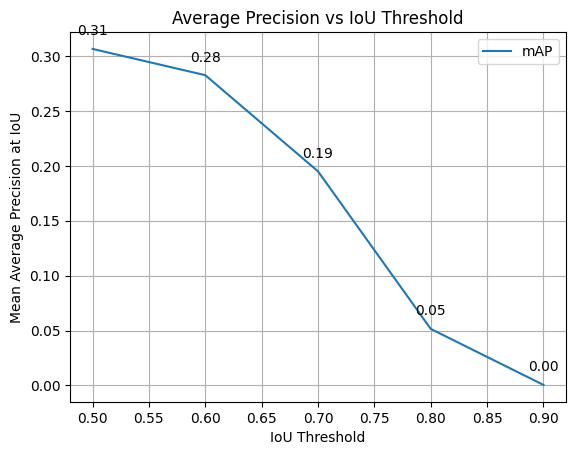

['camping car', 'car', 'pickup', 'truck', 'van']
0    0.116449
1    0.459220
2    0.040180
3    0.031248
4    0.026901
Name: AP, dtype: float64


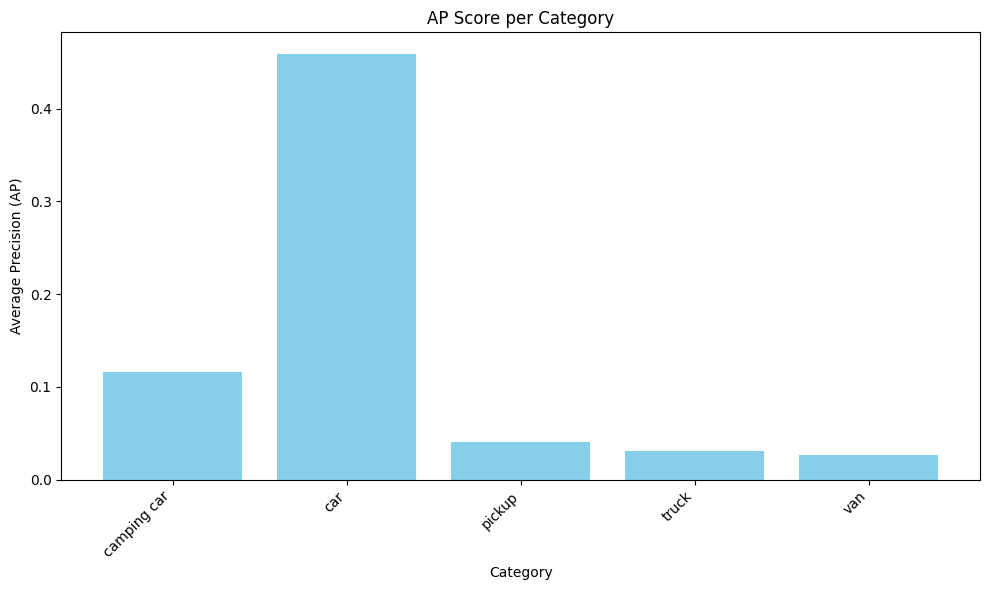

,score threshold,background,localization,classification,cls & loc,duplicate,correct,missed,precision,recall,f1 score
0,0.0,81324,1246,3254,10252,209,965,30,0.009923,0.547984,0.019493
1,1.0,69472,1149,3061,9361,203,963,32,0.011436,0.546848,0.022403
2,2.0,49880,945,2656,7615,186,955,41,0.015345,0.542306,0.029845
3,3.0,29072,674,1960,5177,143,935,58,0.024631,0.530948,0.047077
4,4.0,13594,387,1239,2700,93,913,79,0.048241,0.518455,0.088268
5,5.0,5481,186,865,1007,42,895,137,0.105592,0.508234,0.174856
6,6.0,1964,70,684,269,21,860,232,0.222337,0.488359,0.305560
7,7.0,601,40,541,65,9,827,378,0.397024,0.469620,0.430281
8,8.0,136,30,386,20,2,740,616,0.563166,0.420216,0.481301
9,9.0,21,20,208,5,0,593,949,0.700118,0.336740,0.454755


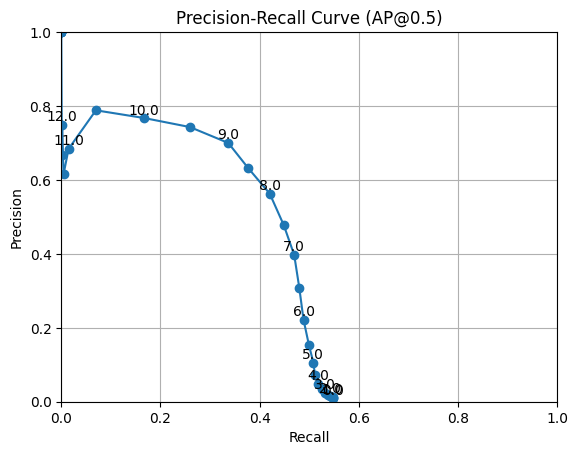

BEST CONFIDENCE THRESHOLD:  8.0


In [22]:
BACKGROUND_IOU_THRESHOLD = [0.1]
FOREGROUND_IOU_THRESHOLDS = [0.5,0.6,0.7,0.8,0.90]
#SCORE_THRESHOLDS = np.linspace(0.9,1,41)
SCORE_THRESHOLDS = [0,0.5,1,1.5,2,2.5,3,3.5,4,4.5,5,5.5,6,6.5,7,7.5,8,8.5,9,9.5,10,10.5,11,11.5,12,12.5,13,13.5,14,14.5,15]
query_F1, correct_scores_zero_th = show_all_analysis(final_targets_df, final_preds_df, 501, category_map)

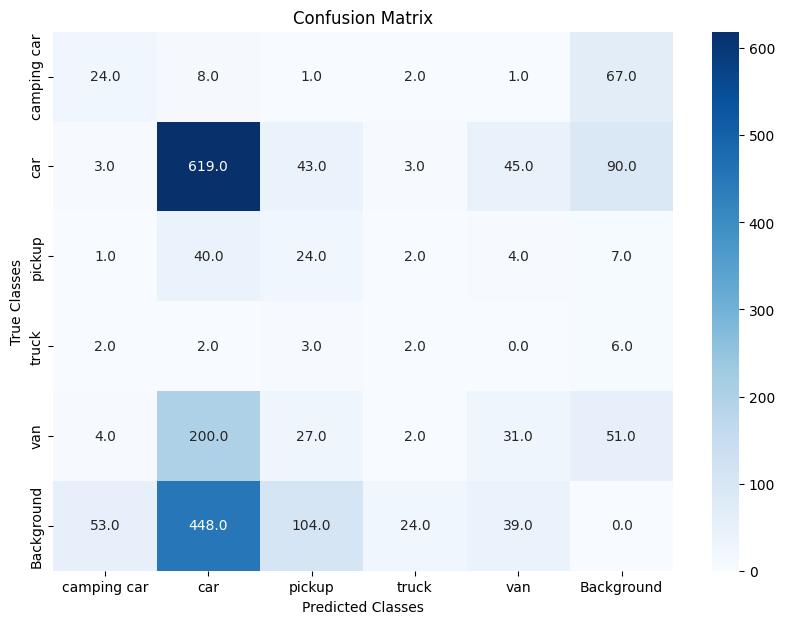

In [23]:
plot_conf_matrix(final_preds_df, final_targets_df, 8, 0.5)

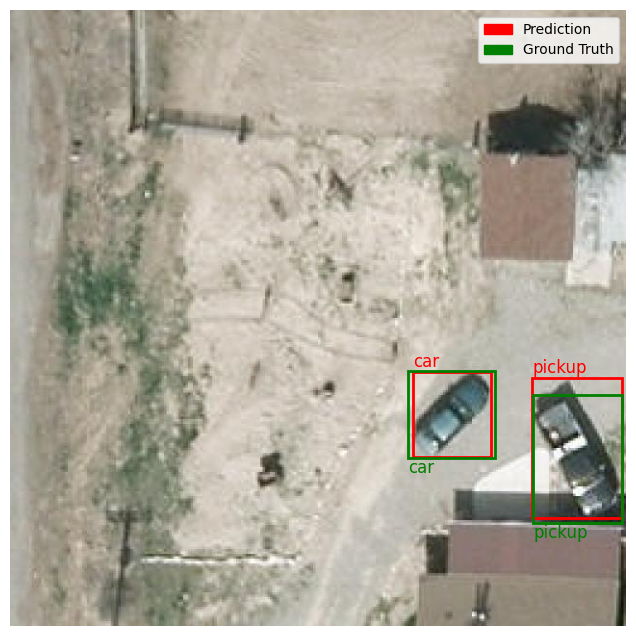

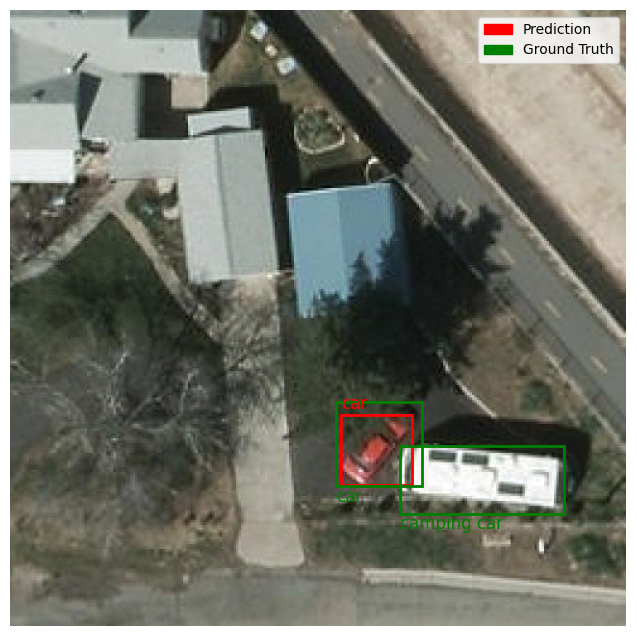

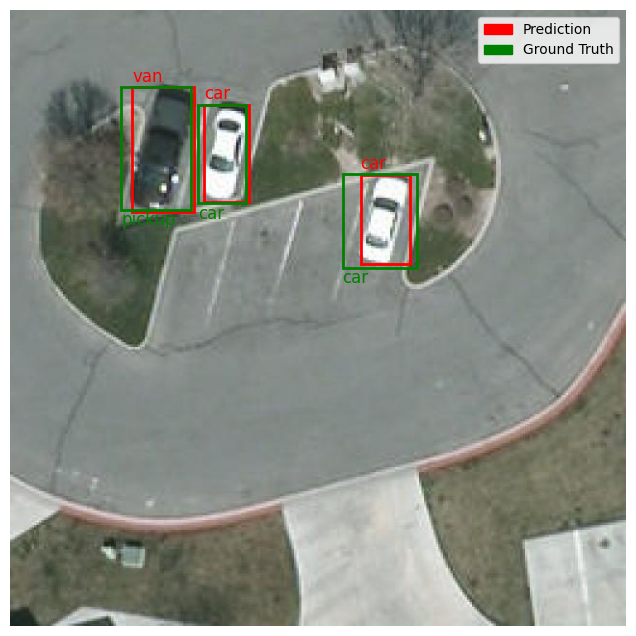

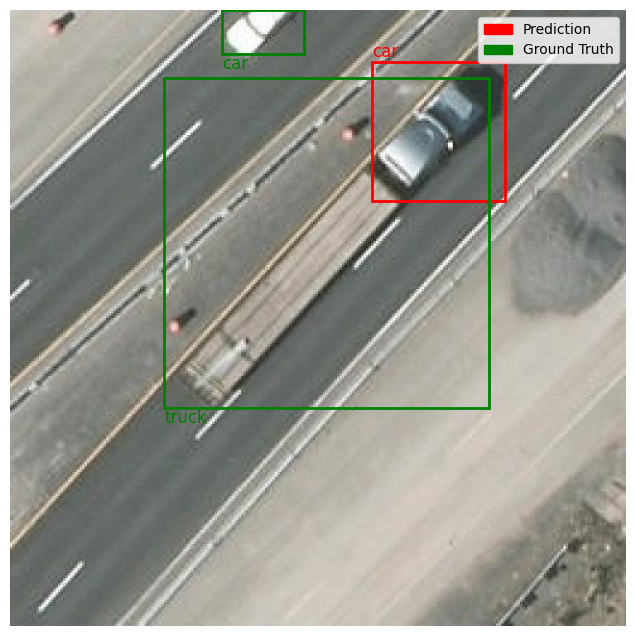

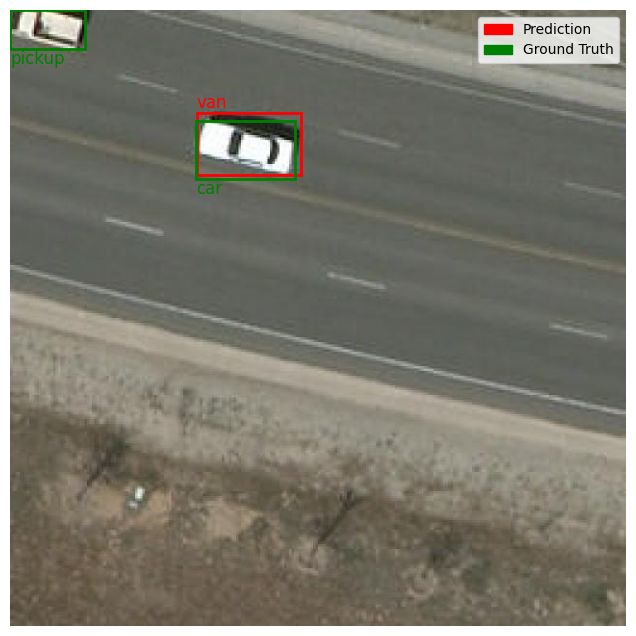

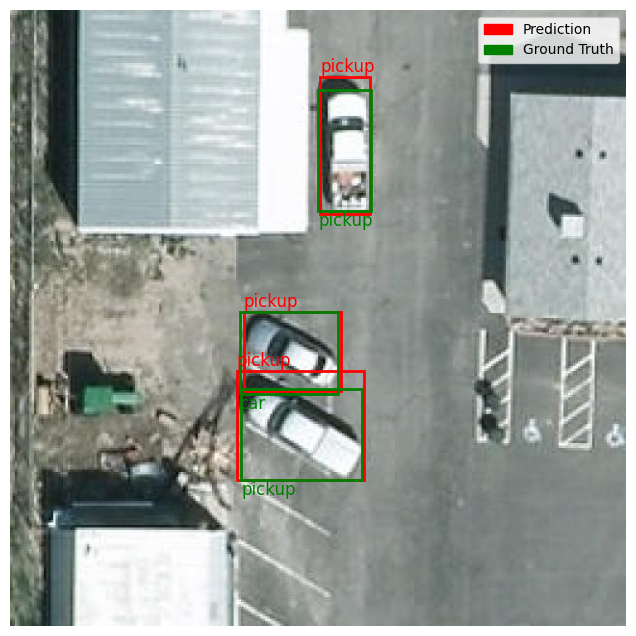

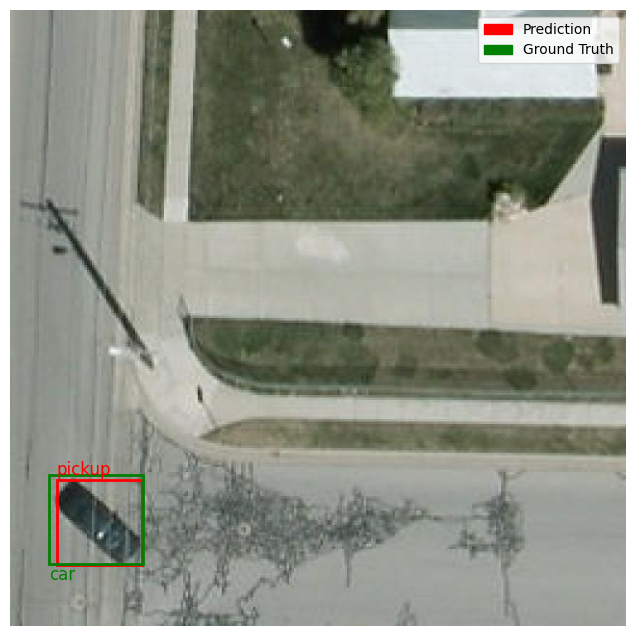

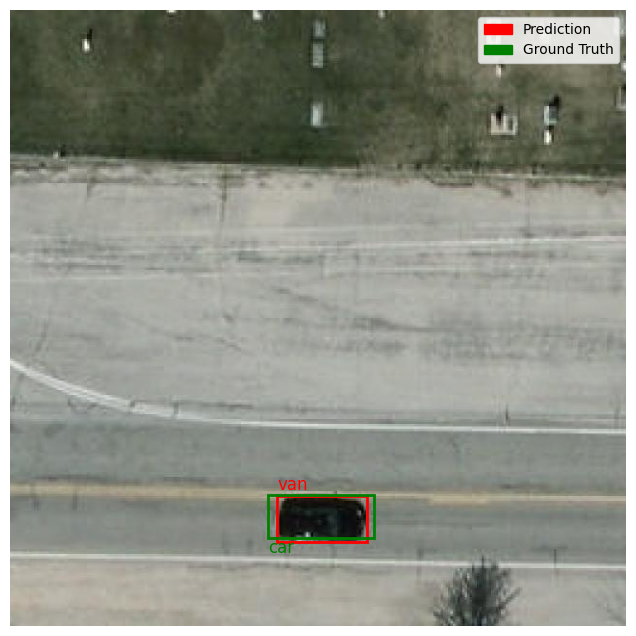

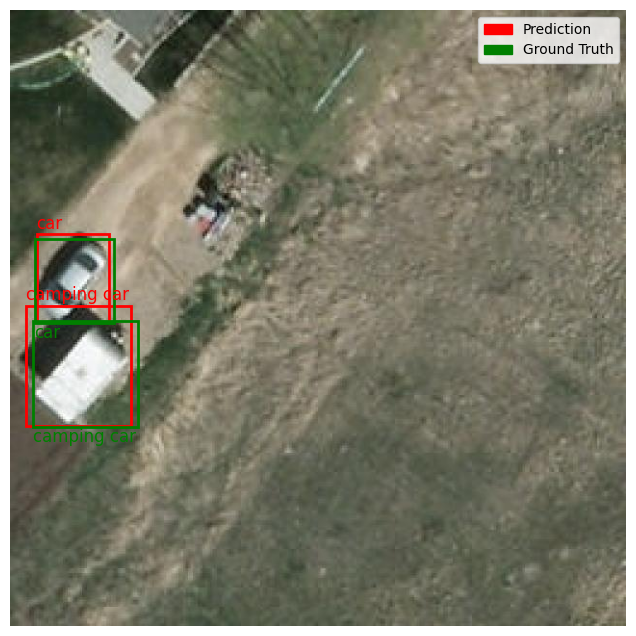

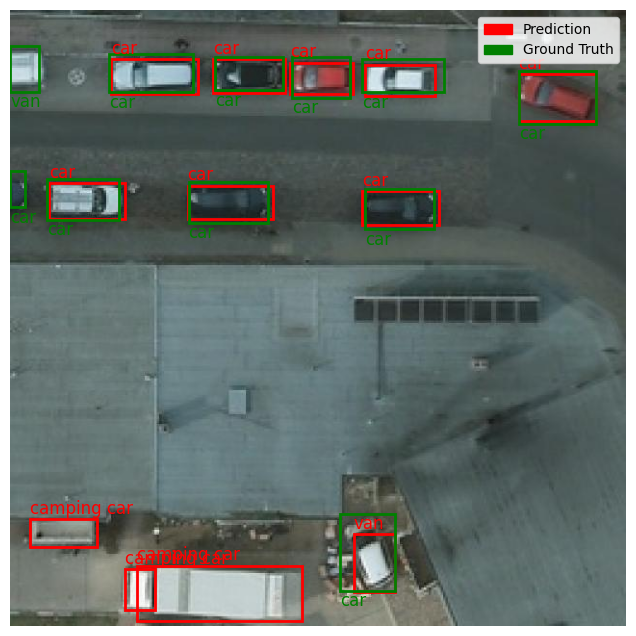

In [32]:
plot_images_with_bboxes(final_preds_df, final_targets_df, image_folder, category_map, score_threshold=8, num_images=10)

# TEXT QUERY

In [24]:
def get_bounding_boxes(texts, target_images):
    
    inputs = processor(text=texts, images=target_images, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model(**inputs)
    return outputs

def post_process_object_detection(outputs, objectness_threshold, img_id):
    preds_df = []
    
    for i in range(len(outputs.logits)):
        # Apply sigmoid to the objectness logits and filter based on the threshold
        objectness_scores = torch.sigmoid(outputs.objectness_logits.cpu()[i])
        object_indices = torch.nonzero(objectness_scores > objectness_threshold).squeeze()

        # If no objects pass the threshold, skip this image
        if object_indices.numel() == 0:
            continue  # Skip the rest of the loop if no objects meet the threshold

        # Get the best scores and corresponding labels
        logits = torch.sigmoid(outputs.logits[i].cpu())
        best_scores, best_query_indices = logits.max(dim=1)

        # Filter scores and labels based on object indices
        best_scores = best_scores[object_indices]
        best_query_labels = best_query_indices[object_indices]

        # Handle case when there's only one bounding box (ensure correct dimensions)
        if object_indices.dim() == 0:
            object_indices = object_indices.unsqueeze(0)
            best_scores = best_scores.unsqueeze(0)
            best_query_labels = best_query_labels.unsqueeze(0)

        # Get bounding boxes and adjust them
        bounding_boxes = outputs.pred_boxes[i][object_indices].cpu()
        if bounding_boxes.dim() == 1:  # Ensure it has the correct shape if only one bounding box
            bounding_boxes = bounding_boxes.unsqueeze(0)

        # Create DataFrame for this image's predictions
        preds_df.append(
            pd.DataFrame({
                "image_id": img_id,
                "score": best_scores,
                "label_id": best_query_labels,
                "xmin": (bounding_boxes[:, 0] - bounding_boxes[:, 2] / 2) * 640,
                "ymin": (bounding_boxes[:, 1] - bounding_boxes[:, 3] / 2) * 640,
                "xmax": (bounding_boxes[:, 0] + bounding_boxes[:, 2] / 2) * 640,
                "ymax": (bounding_boxes[:, 1] + bounding_boxes[:, 3] / 2) * 640
            })
        )
        
    final_preds_df = pd.concat(preds_df, ignore_index=True)

    return final_preds_df

In [27]:
image_folder = "vehicle_detection_satellite_coco/final_images"
img_files = [f for f in os.listdir(image_folder) if f.endswith('.jpg') or f.endswith('.JPG')]

# Initialize lists to accumulate results
all_preds_df = []
all_targets_df = []

texts = [['a camping car', 'a car', 'a pickup', 'a truck', 'a van']]

# Load the COCO annotations JSON file
with open("vehicle_detection_satellite_coco/final_annotations.json") as f:
    coco_data = json.load(f)
    
    file_name_to_id = {item['file_name']: item['id'] for item in coco_data['images']}
    

    for img_id, img_file in enumerate(img_files):
        img_path = os.path.join(image_folder, img_file)
        image = process_single_image(img_path)

        outputs = get_bounding_boxes(texts, [image])

        # Process predictions for the current image
        preds_df = post_process_object_detection(outputs, 0.01, img_id)
        # Add image file name to preds_df
        preds_df['image_file'] = img_file
        all_preds_df.append(preds_df)
        
        ann_image_id = get_image_id(img_file)
        annotations = get_annotations_by_image_id(ann_image_id, coco_data['annotations'])

        # Process the corresponding targets
        targets_df = process_correct_boxes(annotations, img_id)
        # Add image file name to targets_df
        targets_df['image_file'] = img_file
        all_targets_df.append(targets_df)
        
# Concatenate all predictions into a single DataFrame
if all_preds_df:
    #final_preds_df = pd.concat(all_preds_df).reset_index().rename(columns={"index": "pred_id"})
    final_preds_df = pd.concat(all_preds_df).reset_index(drop=True)
    final_preds_df['pred_id'] = final_preds_df.index

    #final_preds_df = final_preds_df.clip(lower=0)  # Ensure no negative values in bounding boxes
else:
    final_preds_df = pd.DataFrame()  # Return an empty DataFrame if there are no predictions

# Concatenate all predictions into a single DataFrame
if all_targets_df:
    #final_targets_df = pd.concat(all_targets_df).reset_index().rename(columns={"index": "target_id"})
    final_targets_df = pd.concat(all_targets_df).reset_index(drop=True)
    final_targets_df['target_id'] = final_targets_df.index

    #final_targets_df = final_targets_df.clip(lower=0)  # Ensure no negative values in bounding boxes
else:
    final_targets_df = pd.DataFrame()  # Return an empty DataFrame if there are no predictions

print(f"Final predictions shape: {final_preds_df.shape}")
print(f"Final targets shape: {final_targets_df.shape}")


Final predictions shape: (105203, 9)
Final targets shape: (1761, 8)


<Figure size 600x600 with 0 Axes>

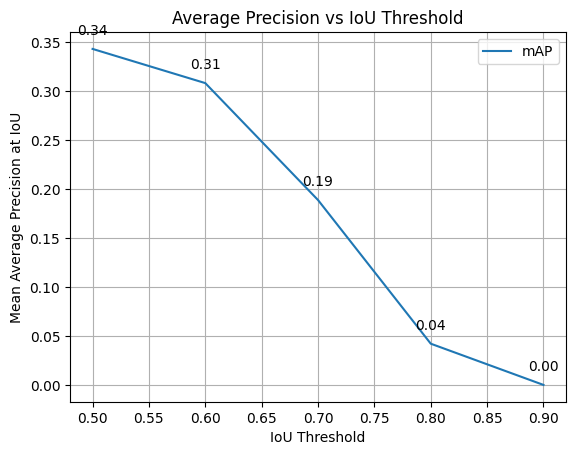

['camping car', 'car', 'pickup', 'truck', 'van']
0    0.001266
1    0.660504
2    0.003953
3    0.079284
4    0.030742
Name: AP, dtype: float64


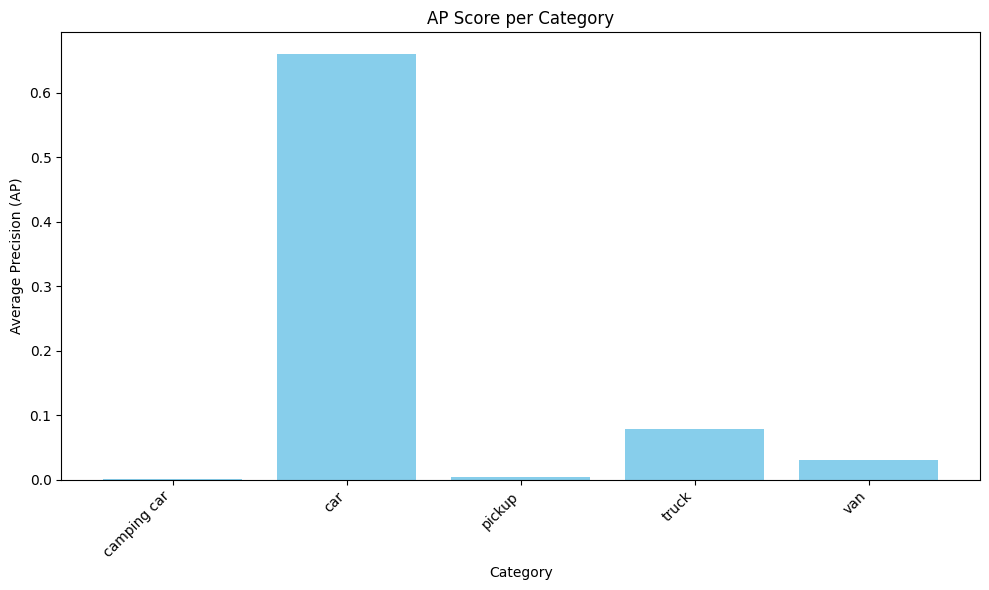

,score threshold,background,localization,classification,cls & loc,duplicate,correct,missed,precision,recall,f1 score
0,0.00,88811,7672,1348,4254,1822,1296,23,0.012319,0.735945,0.024232
1,0.05,10535,2251,712,1060,541,1203,94,0.073795,0.683135,0.133200
2,0.10,3879,948,534,470,174,1152,157,0.160961,0.654174,0.258354
3,0.15,1823,429,444,199,72,1121,227,0.274217,0.636570,0.383313
4,0.20,942,217,359,100,35,1075,317,0.394062,0.610449,0.478949
5,0.25,526,111,315,63,13,1039,383,0.502661,0.590006,0.542842
6,0.30,298,63,267,37,5,988,480,0.595899,0.561045,0.577947
7,0.35,149,44,214,17,0,901,617,0.680000,0.511641,0.583927
8,0.40,68,33,165,10,0,755,819,0.732299,0.428734,0.540831
9,0.45,7,11,66,7,0,409,1280,0.818000,0.232254,0.361787


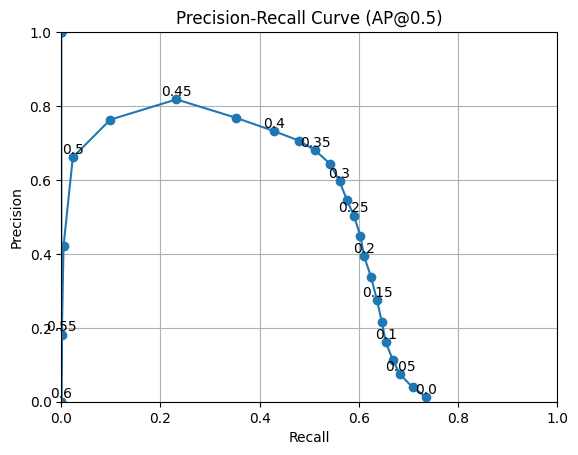

BEST CONFIDENCE THRESHOLD:  0.35


In [28]:
BACKGROUND_IOU_THRESHOLD = [0.1]
FOREGROUND_IOU_THRESHOLDS = [0.5,0.6,0.7,0.8,0.90]
SCORE_THRESHOLDS = np.linspace(0,1,41)
query_F1, correct_scores_zero_th = show_all_analysis(final_targets_df, final_preds_df, 501, category_map)

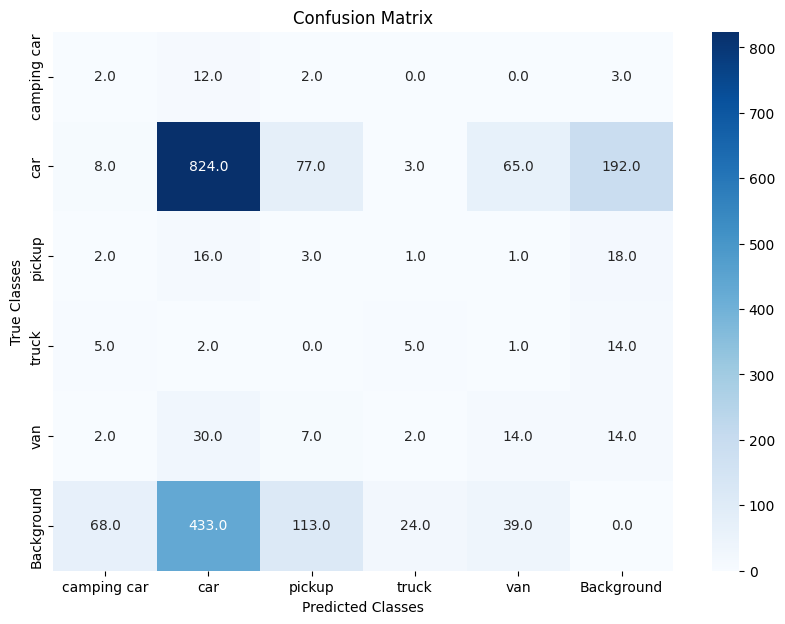

In [29]:
plot_conf_matrix(final_preds_df, final_targets_df, 0.35, 0.5)

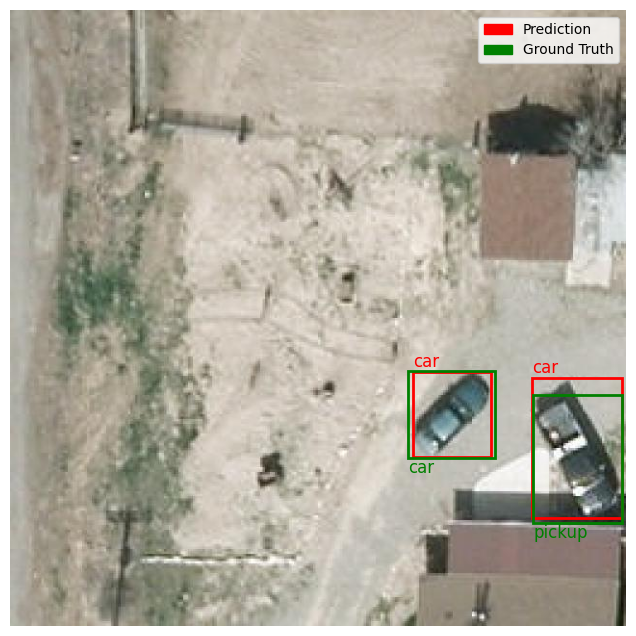

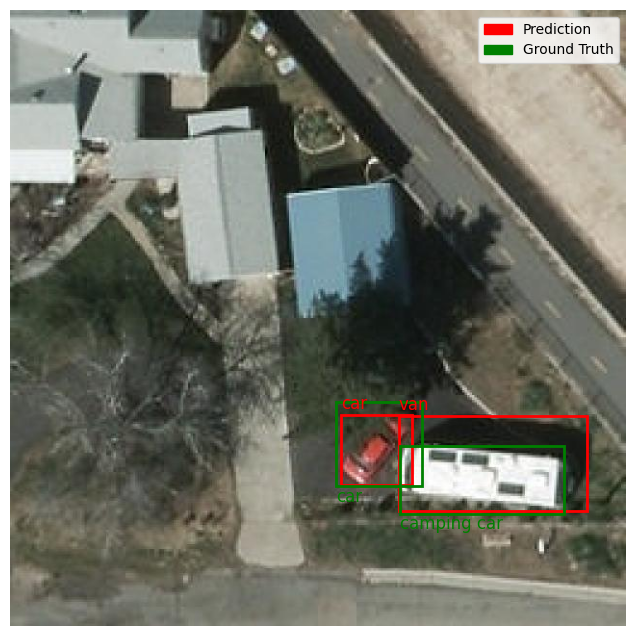

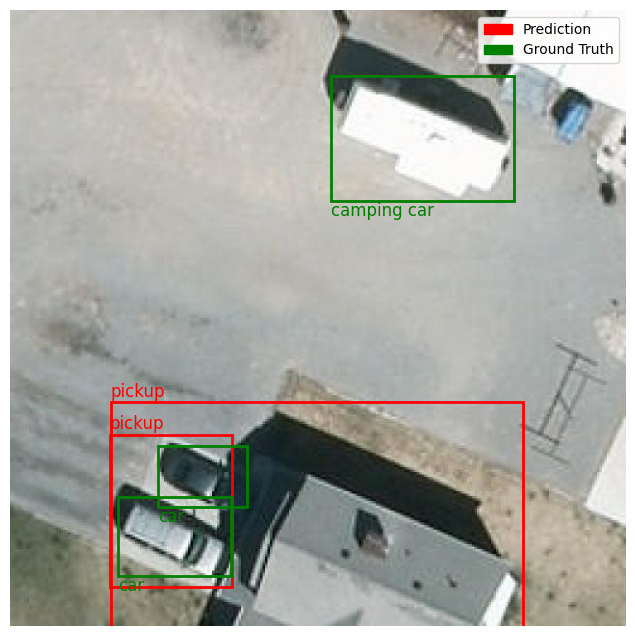

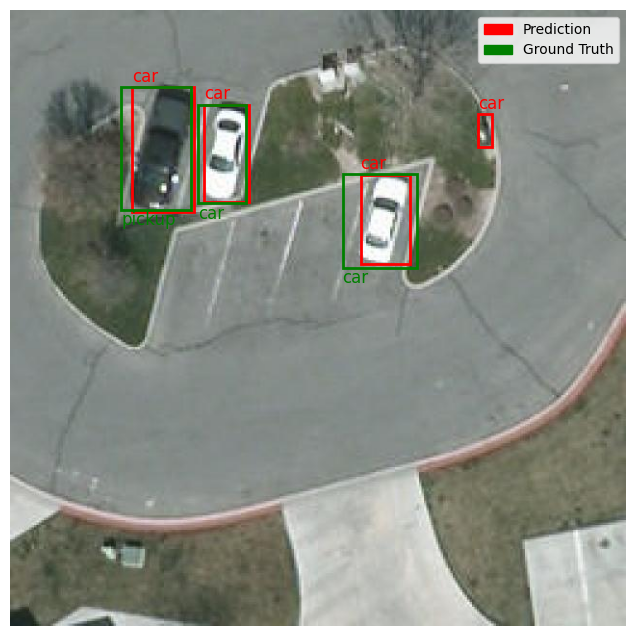

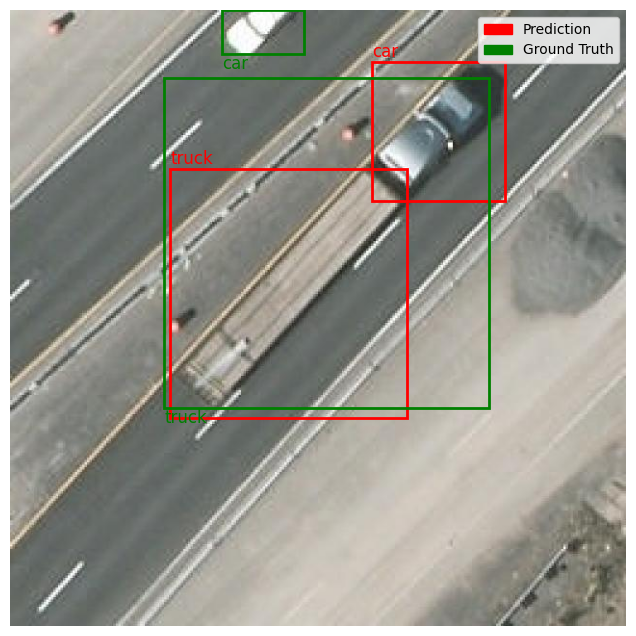

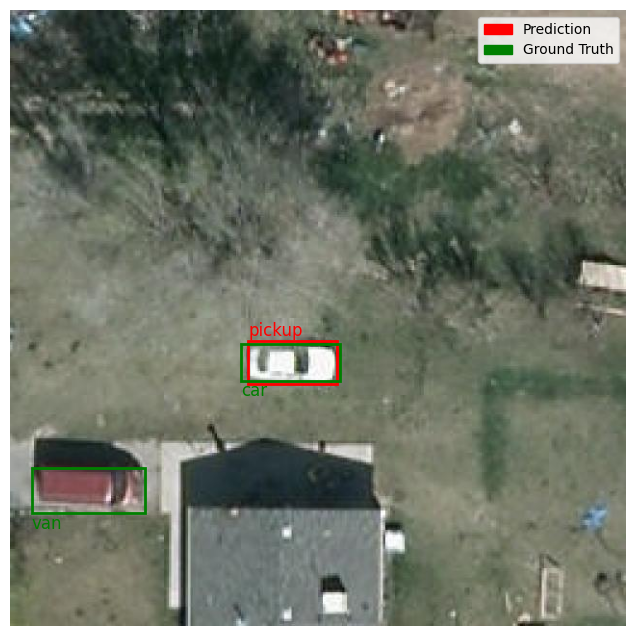

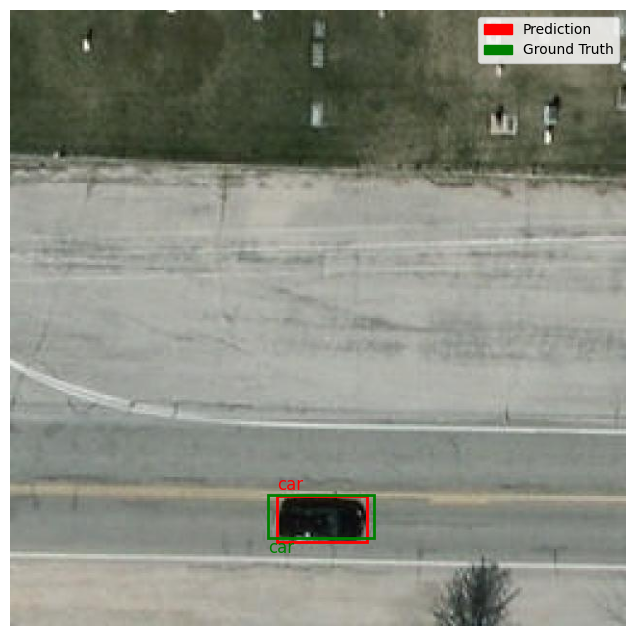

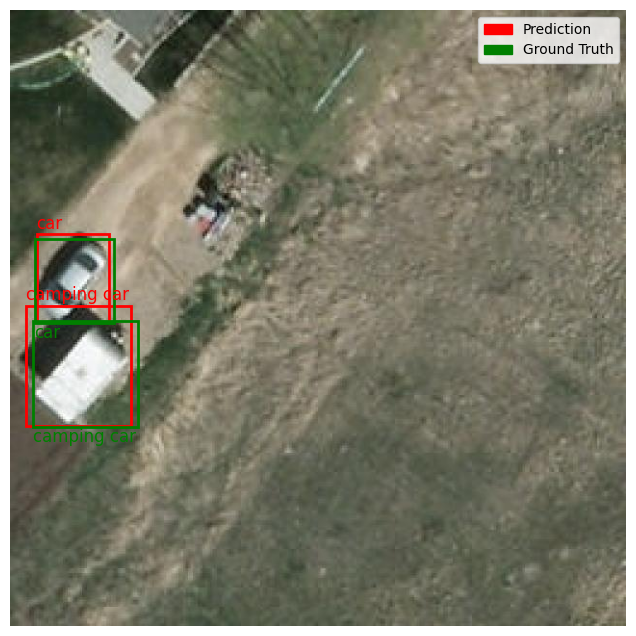

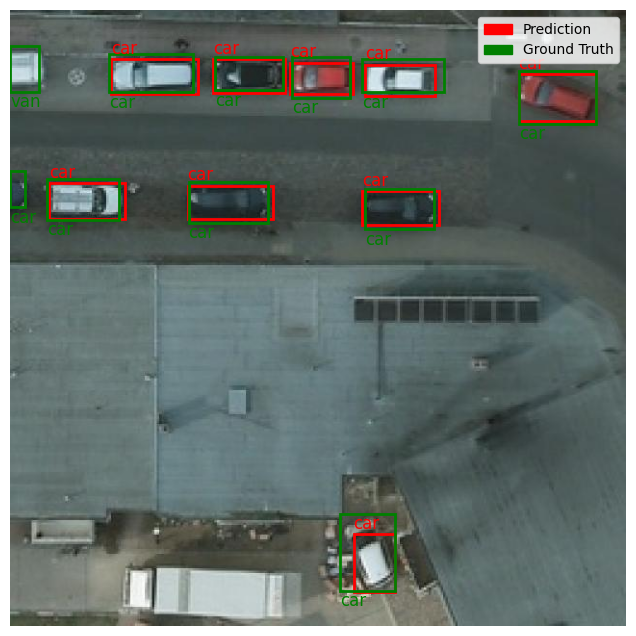

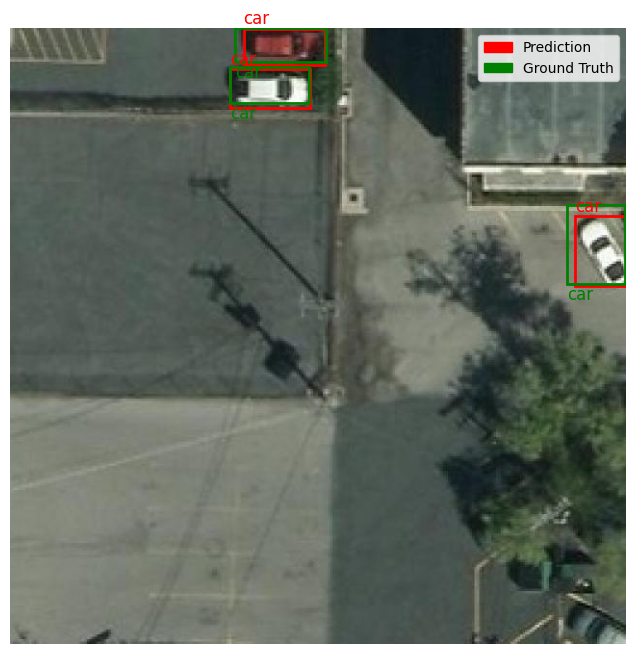

In [30]:
plot_images_with_bboxes(final_preds_df, final_targets_df, image_folder, category_map, score_threshold=0.35, num_images=10)
